In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/pv08.zip -d /content/

Archive:  /content/drive/MyDrive/pv08.zip
   creating: /content/PV03/
   creating: /content/PV03/PV03_Ground_Cropland/
  inflating: /content/PV03/PV03_Ground_Cropland/PV03_314875_1196456.bmp  
  inflating: /content/PV03/PV03_Ground_Cropland/PV03_314875_1196456_label.bmp  
  inflating: /content/PV03/PV03_Ground_Cropland/PV03_314902_1196424.bmp  
  inflating: /content/PV03/PV03_Ground_Cropland/PV03_314902_1196424_label.bmp  
  inflating: /content/PV03/PV03_Ground_Cropland/PV03_314902_1196456.bmp  
  inflating: /content/PV03/PV03_Ground_Cropland/PV03_314902_1196456_label.bmp  
  inflating: /content/PV03/PV03_Ground_Cropland/PV03_314902_1196488.bmp  
  inflating: /content/PV03/PV03_Ground_Cropland/PV03_314902_1196488_label.bmp  
  inflating: /content/PV03/PV03_Ground_Cropland/PV03_314930_1196456.bmp  
  inflating: /content/PV03/PV03_Ground_Cropland/PV03_314930_1196456_label.bmp  
  inflating: /content/PV03/PV03_Ground_Cropland/PV03_314930_1196488.bmp  
  inflating: /content/PV03/PV03_Groun

In [ ]:
!unzip /content/drive/MyDrive/synth-20240228T191317Z-001.zip -d /content/

Archive:  /content/drive/MyDrive/synth-20240228T191317Z-001.zip
  inflating: /content/synth/mask/mask_rt_54.png  
  inflating: /content/synth/mask/mask_rt_39.png  
  inflating: /content/synth/mask/mask_rt_61.png  
  inflating: /content/synth/mask/mask_rt_43.png  
  inflating: /content/synth/mask/mask_rt_62.png  
  inflating: /content/synth/mask/mask_rt_59.png  
  inflating: /content/synth/mask/mask_rt_41.png  
  inflating: /content/synth/mask/mask_rt_42.png  
  inflating: /content/synth/mask/mask_rt_40.png  
  inflating: /content/synth/mask/mask_rt_45.png  
  inflating: /content/synth/mask/mask_rt_44.png  
  inflating: /content/synth/mask/mask_rt_50.png  
  inflating: /content/synth/mask/mask_rt_60.png  
  inflating: /content/synth/mask/mask_rt_47.png  
  inflating: /content/synth/mask/mask_rt_46.png  
  inflating: /content/synth/mask/mask_rt_55.png  
  inflating: /content/synth/mask/mask_rt_56.png  
  inflating: /content/synth/mask/mask_rt_58.png  
  inflating: /content/synth/mask/mas

In [ ]:
!pip install tf-explain

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 1.8 MB/s eta 0:00:00


In [ ]:
import os
import keras
import numpy as np
from glob import glob
from tqdm import tqdm
import tensorflow as tf

import tensorflow.data as tfd
import tensorflow.image as tfi
from tensorflow.keras.utils import load_img, img_to_array

import matplotlib.pyplot as plt

from keras.layers import ReLU
from keras.layers import Input
from keras.layers import Layer
from keras.layers import Conv2D
from keras.layers import Concatenate
from keras.layers import UpSampling2D
from keras.layers import AveragePooling2D
from keras.models import Sequential, Model
from keras.layers import BatchNormalization

from tensorflow.keras.applications import ResNet50

from keras.callbacks import Callback, ModelCheckpoint

from tensorflow.keras.utils import plot_model

from tf_explain.core.grad_cam import GradCAM


In [ ]:
subdirs = [x[0] for x in os.walk("/content/PV03/")]
subdirs[1:]


['/content/PV03/PV03_Ground_Shrubwood',
 '/content/PV03/PV03_Ground_WaterSurface',
 '/content/PV03/PV03_Ground_Grassland',
 '/content/PV03/PV03_Ground_Cropland',
 '/content/PV03/PV03_Rooftop',
 '/content/PV03/PV03_Ground_SalineAlkali']

In [ ]:
image_paths = []

for subdir in subdirs[1:]:
    for file in os.listdir(subdir):
        image_paths.append(os.path.join(subdir, file))


In [ ]:
len(image_paths)

4616

In [ ]:
image_paths[:10]

['/content/PV03/PV03_Ground_Shrubwood/PV03_338104_1178780_label.bmp',
 '/content/PV03/PV03_Ground_Shrubwood/PV03_335878_1191839_label.bmp',
 '/content/PV03/PV03_Ground_Shrubwood/PV03_332175_1180242.bmp',
 '/content/PV03/PV03_Ground_Shrubwood/PV03_331877_1180644_label.bmp',
 '/content/PV03/PV03_Ground_Shrubwood/PV03_332120_1180277.bmp',
 '/content/PV03/PV03_Ground_Shrubwood/PV03_331847_1180513.bmp',
 '/content/PV03/PV03_Ground_Shrubwood/PV03_334265_1181087.bmp',
 '/content/PV03/PV03_Ground_Shrubwood/PV03_335910_1181845.bmp',
 '/content/PV03/PV03_Ground_Shrubwood/PV03_332123_1180441.bmp',
 '/content/PV03/PV03_Ground_Shrubwood/PV03_319271_1194133_label.bmp']

In [ ]:
image_paths[0].split("_")

['/content/PV03/PV03',
 'Ground',
 'Shrubwood/PV03',
 '338104',
 '1178780',
 'label.bmp']

In [ ]:
images = [i for i in image_paths if "label.bmp" not in i.split("_")]
images = [i for i in images if i.endswith(".bmp")]
masks = [i[:-4]+"_label.bmp" for i in images]
len(images), len(masks)

(2308, 2308)

In [ ]:
images_synth_path = "/content/synth/img"
mask_synth_path = "/content/synth/mask"

images_synth = []
for file in os.listdir(images_synth_path):
        if file.endswith(".png"):
          images_synth.append(os.path.join(images_synth_path, file))

masks_synth = []
for file in os.listdir(mask_synth_path):
        if file.endswith(".png"):
          masks_synth.append(os.path.join(mask_synth_path, file))

len(images_synth), len(masks_synth)

from PIL import Image

for i in images_synth:
  with Image.open(i) as img:
    img.save(i[:-4]+".bmp")

for i in masks_synth:
  with Image.open(i) as img:
    img.save(i[:-4]+".bmp")


In [ ]:
masks_synth[0]

'/content/synth/mask/mask_gs_4.png'

In [ ]:
images_synth[0]

'/content/synth/img/modified_image_gs_85.png'

In [ ]:
masks_synth.sort()
images_synth.sort()

In [ ]:
masks_synth[:15]

['/content/synth/mask/mask_gg_1.png',
 '/content/synth/mask/mask_gg_10.png',
 '/content/synth/mask/mask_gg_11.png',
 '/content/synth/mask/mask_gg_12.png',
 '/content/synth/mask/mask_gg_2.png',
 '/content/synth/mask/mask_gg_3.png',
 '/content/synth/mask/mask_gg_4.png',
 '/content/synth/mask/mask_gg_5.png',
 '/content/synth/mask/mask_gg_6.png',
 '/content/synth/mask/mask_gg_7.png',
 '/content/synth/mask/mask_gg_8.png',
 '/content/synth/mask/mask_gg_9.png',
 '/content/synth/mask/mask_gs_1.png',
 '/content/synth/mask/mask_gs_10.png',
 '/content/synth/mask/mask_gs_11.png']

In [ ]:
images_synth[:15]

['/content/synth/img/modified_image_gg_1.png',
 '/content/synth/img/modified_image_gg_10.png',
 '/content/synth/img/modified_image_gg_11.png',
 '/content/synth/img/modified_image_gg_12.png',
 '/content/synth/img/modified_image_gg_2.png',
 '/content/synth/img/modified_image_gg_3.png',
 '/content/synth/img/modified_image_gg_4.png',
 '/content/synth/img/modified_image_gg_5.png',
 '/content/synth/img/modified_image_gg_6.png',
 '/content/synth/img/modified_image_gg_7.png',
 '/content/synth/img/modified_image_gg_8.png',
 '/content/synth/img/modified_image_gg_9.png',
 '/content/synth/img/modified_image_gs_1.png',
 '/content/synth/img/modified_image_gs_10.png',
 '/content/synth/img/modified_image_gs_11.png']

In [ ]:
print(masks_synth[18])
print(images_synth[18])

/content/synth/mask/mask_gs_15.png
/content/synth/img/modified_image_gs_15.png


In [ ]:
images = images + images_synth
masks = masks + masks_synth

In [ ]:
len(images), len(masks)

(2528, 2528)

In [ ]:
for i in masks:
    if not os.path.exists(i):
        print(i)

In [ ]:
# images.sort()
# masks.sort()
images[2000], masks[2000]

('/content/PV03/PV03_Ground_SalineAlkali/PV03_344241_1199412.bmp',
 '/content/PV03/PV03_Ground_SalineAlkali/PV03_344241_1199412_label.bmp')

In [ ]:
import pandas as pd

df = pd.DataFrame(columns = ['path', 'mask_path', 'class'])
df['path'] = images
df['mask_path'] = masks
df['class'] = 1

df.head(10)

,path,mask_path,class
0,/content/PV03/PV03_Ground_Shrubwood/PV03_33217...,/content/PV03/PV03_Ground_Shrubwood/PV03_33217...,1
1,/content/PV03/PV03_Ground_Shrubwood/PV03_33212...,/content/PV03/PV03_Ground_Shrubwood/PV03_33212...,1
2,/content/PV03/PV03_Ground_Shrubwood/PV03_33184...,/content/PV03/PV03_Ground_Shrubwood/PV03_33184...,1
3,/content/PV03/PV03_Ground_Shrubwood/PV03_33426...,/content/PV03/PV03_Ground_Shrubwood/PV03_33426...,1
4,/content/PV03/PV03_Ground_Shrubwood/PV03_33591...,/content/PV03/PV03_Ground_Shrubwood/PV03_33591...,1
5,/content/PV03/PV03_Ground_Shrubwood/PV03_33212...,/content/PV03/PV03_Ground_Shrubwood/PV03_33212...,1
6,/content/PV03/PV03_Ground_Shrubwood/PV03_33200...,/content/PV03/PV03_Ground_Shrubwood/PV03_33200...,1
7,/content/PV03/PV03_Ground_Shrubwood/PV03_33212...,/content/PV03/PV03_Ground_Shrubwood/PV03_33212...,1
8,/content/PV03/PV03_Ground_Shrubwood/PV03_33407...,/content/PV03/PV03_Ground_Shrubwood/PV03_33407...,1
9,/content/PV03/PV03_Ground_Shrubwood/PV03_33421...,/content/PV03/PV03_Ground_Shrubwood/PV03_33421...,1


In [ ]:
len(df)

2528

In [ ]:
d2 = df.iloc[:int(len(df)*0.85)]
test_set = df.iloc[int(len(df)*0.85):]

In [ ]:
img_size = [512,512]

def data_augmentation(car_img, mask_img):
    if tf.random.uniform(()) > 0.5:
        car_img = tf.image.flip_left_right(car_img)
        mask_img = tf.image.flip_left_right(mask_img)

    return car_img, mask_img


def preprocessing(car_path, mask_path):
    car_img = tf.io.read_file(car_path)
    car_img = tf.image.decode_bmp(car_img, channels=3)
    car_img = tf.image.resize(car_img, img_size)
    car_img = tf.cast(car_img, tf.float32) / 255.0

    mask_img = tf.io.read_file(mask_path)
    mask_img = tf.image.decode_bmp(mask_img, channels=3)
    mask_img = tf.image.resize(mask_img, img_size)
    mask_img = mask_img[:,:,:1]
    mask_img = tf.math.sign(mask_img)

    return car_img, mask_img

def create_dataset(df, train = False):
    if not train:
        ds = tf.data.Dataset.from_tensor_slices((df["path"].values, df["mask_path"].values))
        ds = ds.map(preprocessing, tf.data.AUTOTUNE)
    else:
        ds = tf.data.Dataset.from_tensor_slices((df["path"].values, df["mask_path"].values))
        ds = ds.map(preprocessing, tf.data.AUTOTUNE)
        ds = ds.map(data_augmentation, tf.data.AUTOTUNE)

    return ds

In [ ]:
len(d2), len(test_set)

(2148, 380)

In [ ]:
from sklearn.model_selection import train_test_split

train_df, valid_df = train_test_split(d2, random_state=42, test_size=.25)
train = create_dataset(train_df, train = True)
valid = create_dataset(valid_df)
test = create_dataset(test_set)

In [ ]:
from keras import layers

In [ ]:
def convolution_block(
    block_input,
    num_filters=256,
    kernel_size=3,
    dilation_rate=1,
    padding="same",
    use_bias=False,
):
    x = layers.Conv2D(
        num_filters,
        kernel_size=kernel_size,
        dilation_rate=dilation_rate,
        padding="same",
        use_bias=use_bias,
        kernel_initializer=keras.initializers.HeNormal(),
    )(block_input)
    x = layers.BatchNormalization()(x)
    return tf.nn.relu(x)


def DilatedSpatialPyramidPooling(dspp_input):
    dims = dspp_input.shape
    x = layers.AveragePooling2D(pool_size=(dims[-3], dims[-2]))(dspp_input)
    x = convolution_block(x, kernel_size=1, use_bias=True)
    out_pool = layers.UpSampling2D(
        size=(dims[-3] // x.shape[1], dims[-2] // x.shape[2]), interpolation="bilinear",
    )(x)

    out_1 = convolution_block(dspp_input, kernel_size=1, dilation_rate=1)
    out_6 = convolution_block(dspp_input, kernel_size=3, dilation_rate=6)
    out_12 = convolution_block(dspp_input, kernel_size=3, dilation_rate=12)
    out_18 = convolution_block(dspp_input, kernel_size=3, dilation_rate=18)

    x = layers.Concatenate(axis=-1)([out_pool, out_1, out_6, out_12, out_18])
    output = convolution_block(x, kernel_size=1)
    return output

In [ ]:
IMAGE_SIZE = 512
BATCH_SIZE = 4
NUM_CLASSES = 2
TRAIN_LENGTH = len(train_df)


In [ ]:
def DeeplabV3Plus(image_size, num_classes):
    model_input = keras.Input(shape=(image_size, image_size, 3))
    resnet50 = keras.applications.ResNet50(
        weights="imagenet", include_top=False, input_tensor=model_input
    )
    x = resnet50.get_layer("conv4_block6_2_relu").output
    x = DilatedSpatialPyramidPooling(x)

    input_a = layers.UpSampling2D(
        size=(image_size // 4 // x.shape[1], image_size // 4 // x.shape[2]),
        interpolation="bilinear",
    )(x)
    input_b = resnet50.get_layer("conv2_block3_2_relu").output
    input_b = convolution_block(input_b, num_filters=48, kernel_size=1)

    x = layers.Concatenate(axis=-1)([input_a, input_b])
    x = convolution_block(x)
    x = convolution_block(x)
    x = layers.UpSampling2D(
        size=(image_size // x.shape[1], image_size // x.shape[2]),
        interpolation="bilinear",
    )(x)
    model_output = layers.Conv2D(num_classes, kernel_size=(1, 1), padding="same")(x)
    return keras.Model(inputs=model_input, outputs=model_output)


model = DeeplabV3Plus(image_size=IMAGE_SIZE, num_classes=NUM_CLASSES)
model.summary()



94765736/94765736 [==============================] - 0s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 512, 512, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 518, 518, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 256, 256, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 256, 256, 64)         256       ['conv1_conv[0][0]']          
 on)                         

In [ ]:
def visualize(display_list):
    plt.figure(figsize=(12,12))
    title = ['Input Image', 'True Mask', 'Predicted Mask']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

def show_predictions(sample_image, sample_mask):
    predictions = model.predict(np.expand_dims((sample_image), axis=0))
    predictions = np.squeeze(predictions)
    predictions = np.argmax(predictions, axis=2)
    pred_mask = predictions
    pred_mask = pred_mask.reshape(img_size[0],img_size[1],1)
    visualize([sample_image, sample_mask, pred_mask])

In [ ]:
import keras.backend as K

In [ ]:
BUFFER_SIZE = 1000
train_dataset = train.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE).repeat()
train_dataset = train_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
valid_dataset = valid.batch(BATCH_SIZE)
test_dataset = test.batch(BATCH_SIZE)

In [ ]:
test_dataset.take(123)

<_TakeDataset element_spec=(TensorSpec(shape=(None, 512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 512, 512, 1), dtype=tf.float32, name=None))>

In [ ]:
test_dataset.take(123)

<_TakeDataset element_spec=(TensorSpec(shape=(None, 512, 512, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 512, 512, 1), dtype=tf.float32, name=None))>

In [ ]:
def display(display_list):
    plt.figure(figsize=(12,12))
    title = ['Input Image','True Mask','Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

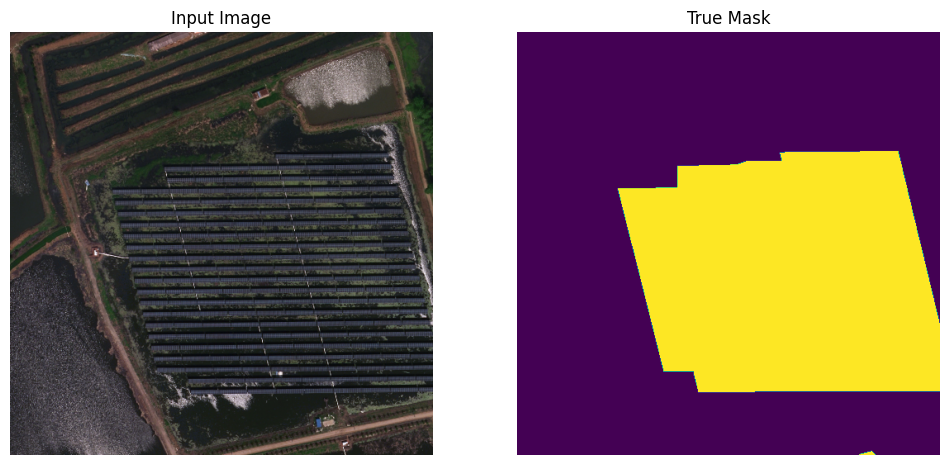

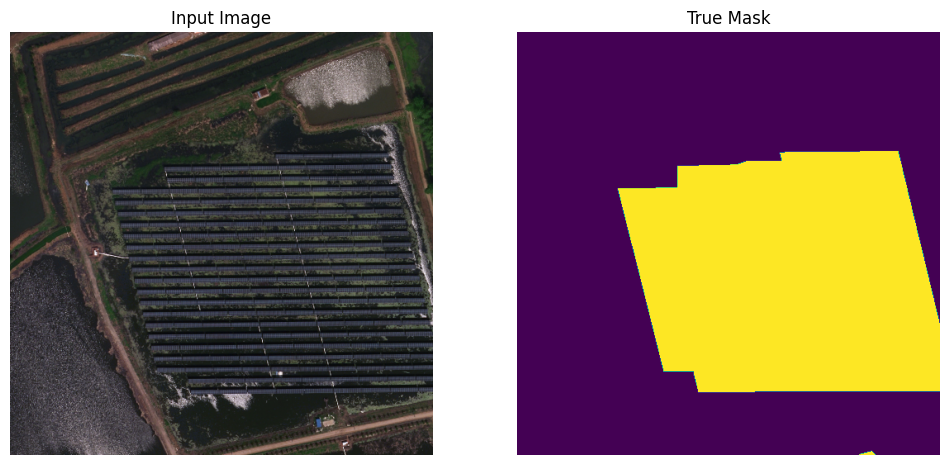

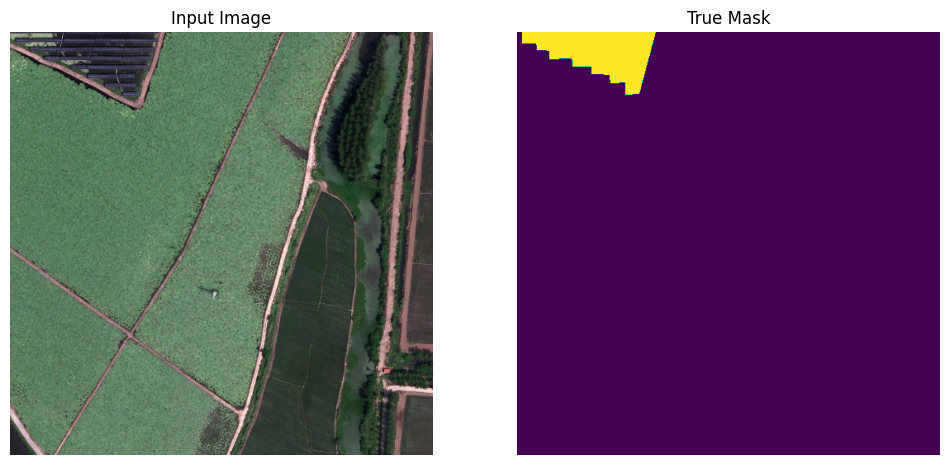

In [ ]:
for i in range(3):
    for image, mask in train.take(i):
        sample_image, sample_mask = image, mask
        display([sample_image, sample_mask])

In [ ]:
import matplotlib
def visualize(display_list):
    plt.figure(figsize=(12,12))
    title = ['Input Image', 'True Mask', 'Predicted Mask']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

def show_prediction(sample_image):

    predictions = model.predict(np.expand_dims((sample_image), axis=0))
    predictions = np.squeeze(predictions)
    predictions = np.argmax(predictions, axis=2)
    pred_mask = predictions
    pred_mask = pred_mask.reshape(img_size[0],img_size[1],1)
    # visualize([sample_image, sample_mask, pred_mask])

    image = keras.utils.array_to_img(sample_image)
    image = np.array(sample_image).astype(np.uint8)
    # overlay = cv2.addWeighted(sample_image, 0.35, pred_mask, 0.65, 0)
    plt.figure(figsize=(6,6))
    cmap1 = matplotlib.colors.ListedColormap(['none', 'green'])
    cmap2 = matplotlib.colors.ListedColormap(['none', 'yellow'])
    plt.axis('off')
    plt.imshow(sample_image, cmap=cmap1)
    plt.imshow(pred_mask, cmap=cmap2, alpha=0.4)
    plt.show()


1/1 [==============================] - 4s 4s/step


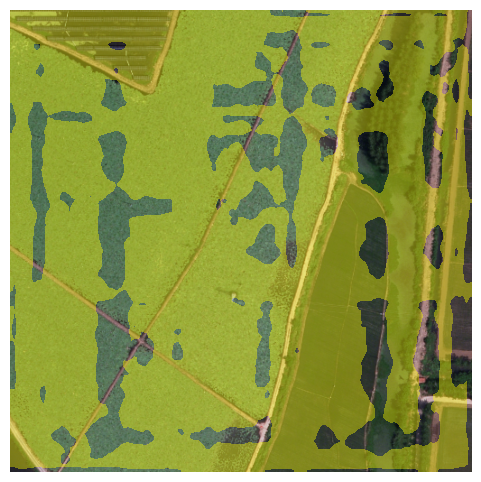

In [ ]:
show_prediction(sample_image)

1/1 [==============================] - 1s 857ms/step


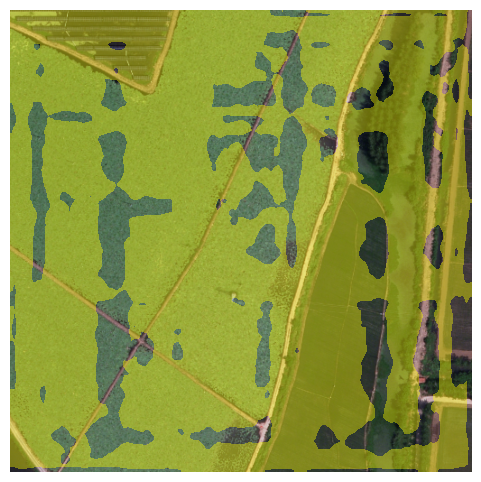

Epoch 1/30
1/1 [==============================] - 0s 40ms/step


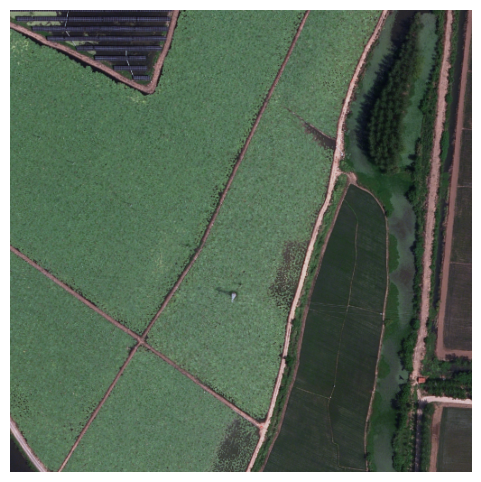

Epoch 2/30
1/1 [==============================] - 0s 32ms/step


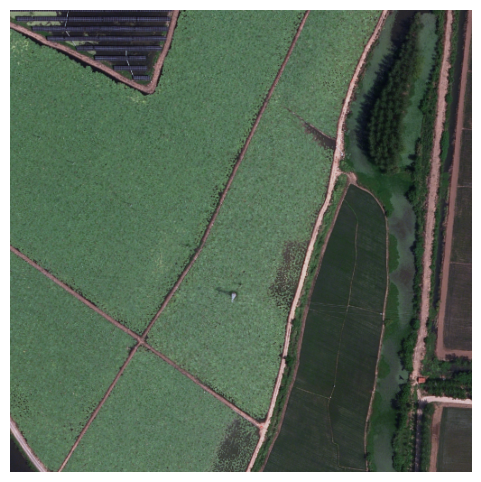

Epoch 3/30
1/1 [==============================] - 0s 31ms/step


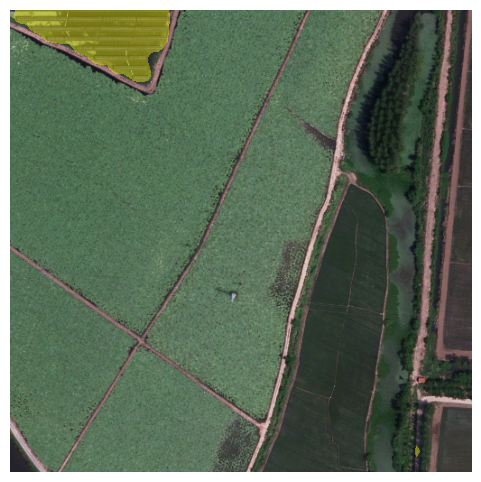

Epoch 4/30
1/1 [==============================] - 0s 30ms/step


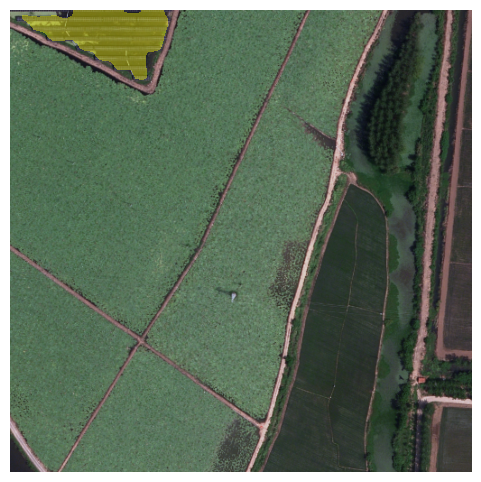

Epoch 5/30
1/1 [==============================] - 0s 30ms/step


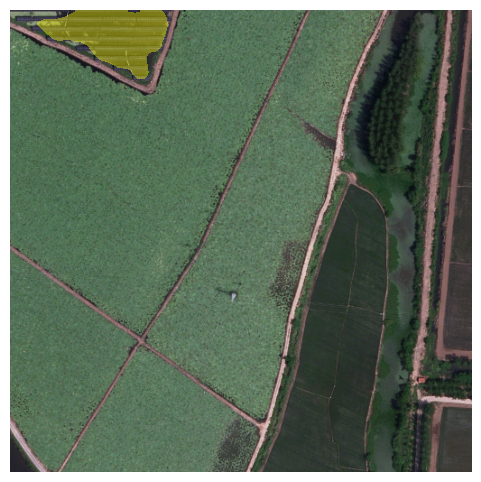

Epoch 6/30
1/1 [==============================] - 0s 30ms/step


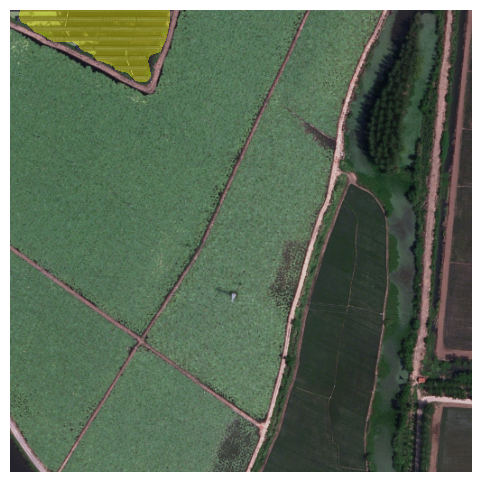

Epoch 7/30
1/1 [==============================] - 0s 30ms/step


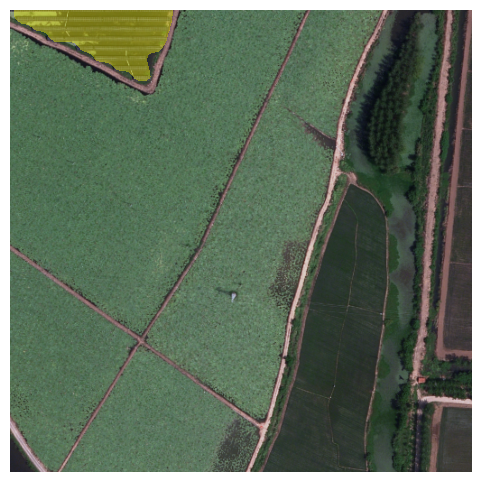

Epoch 8/30
1/1 [==============================] - 0s 30ms/step


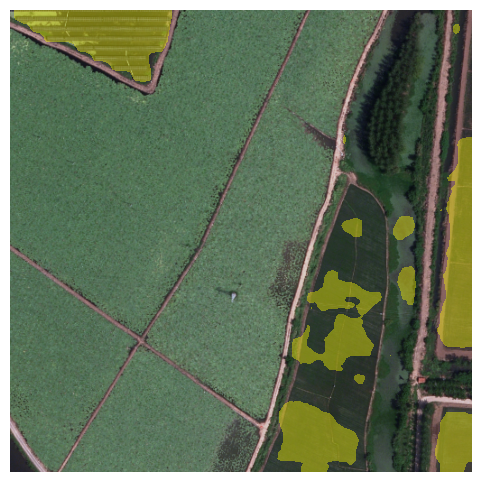

Epoch 9/30
1/1 [==============================] - 0s 31ms/step


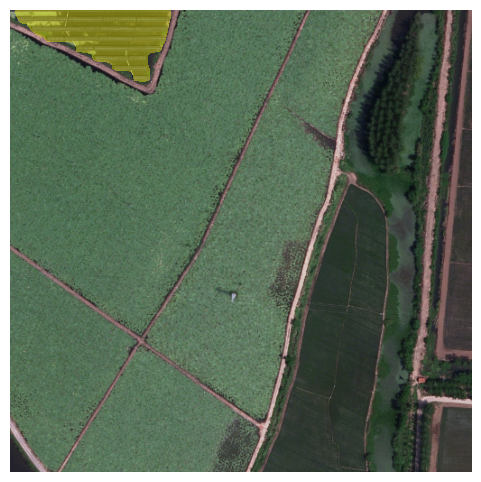

Epoch 10/30
1/1 [==============================] - 0s 30ms/step


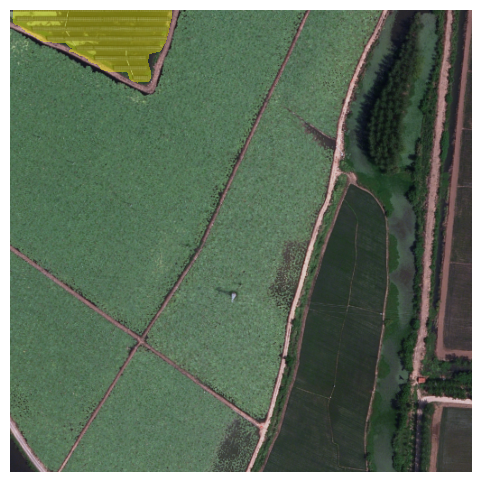

Epoch 11/30
1/1 [==============================] - 0s 34ms/step


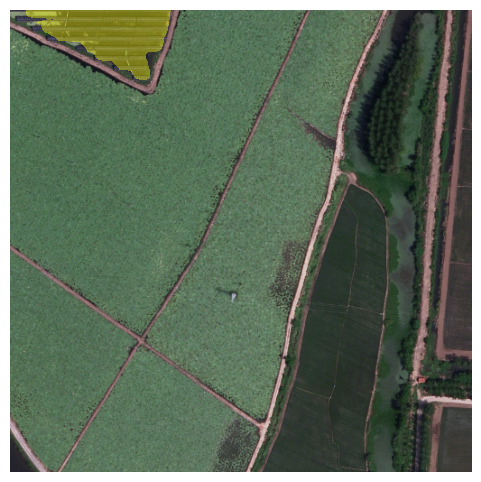

Epoch 12/30
1/1 [==============================] - 0s 34ms/step


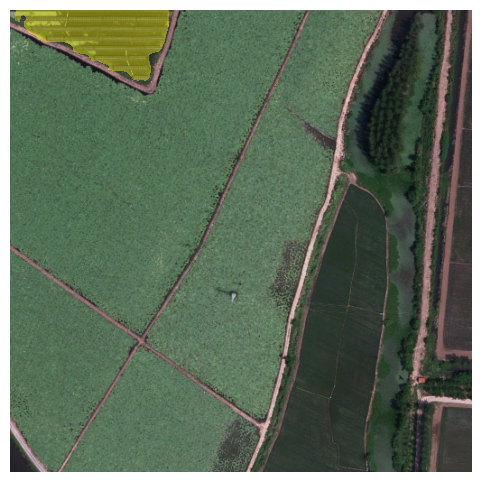

Epoch 13/30
1/1 [==============================] - 0s 34ms/step


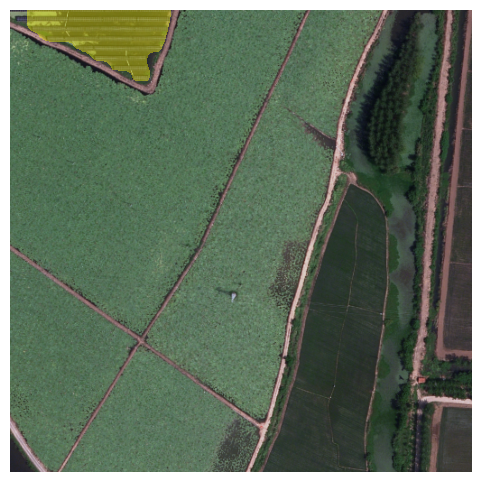

Epoch 14/30
1/1 [==============================] - 0s 44ms/step


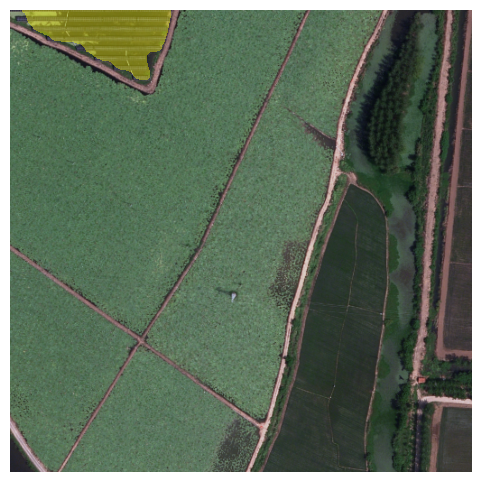

Epoch 15/30
1/1 [==============================] - 0s 33ms/step


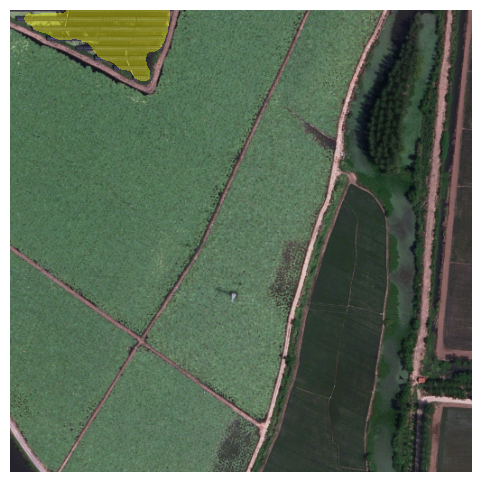

Epoch 16/30
1/1 [==============================] - 0s 33ms/step


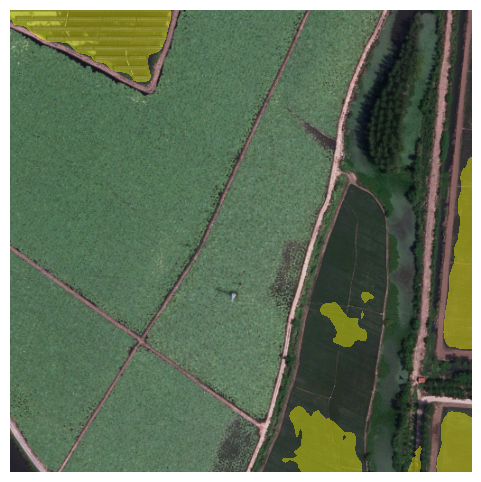

Epoch 17/30
1/1 [==============================] - 0s 47ms/step


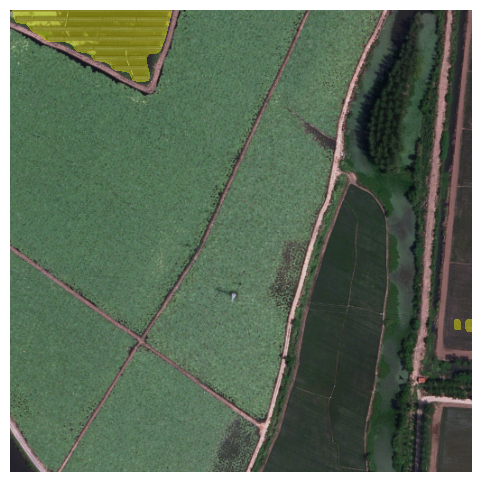

Epoch 18/30
1/1 [==============================] - 0s 29ms/step


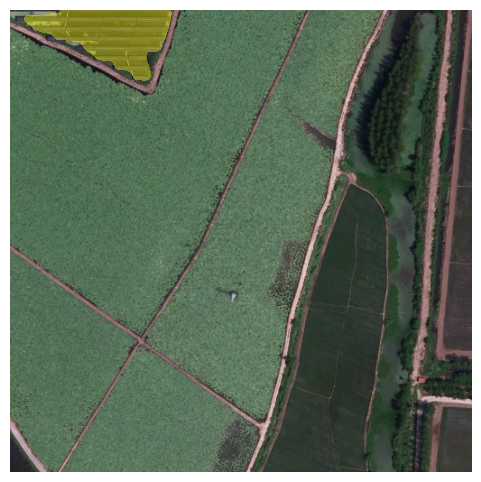

Epoch 19/30
1/1 [==============================] - 0s 31ms/step


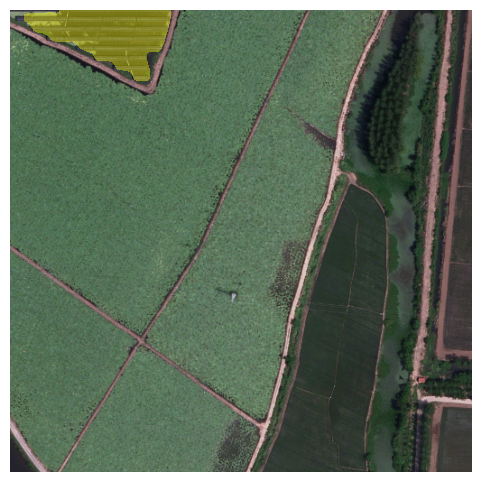

Epoch 20/30
1/1 [==============================] - 0s 30ms/step


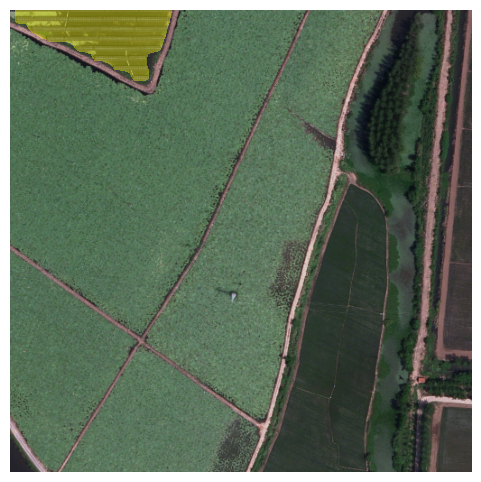

Epoch 21/30
1/1 [==============================] - 0s 44ms/step


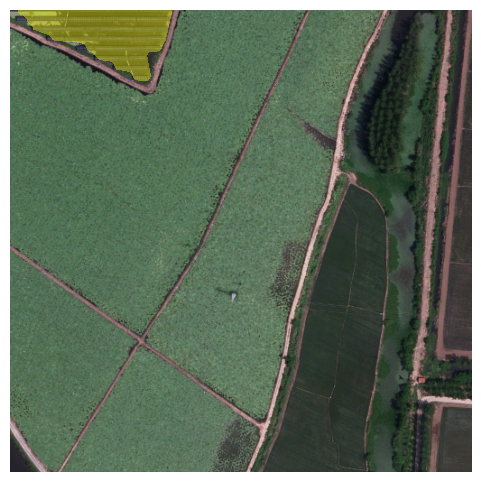

Epoch 22/30
1/1 [==============================] - 0s 35ms/step


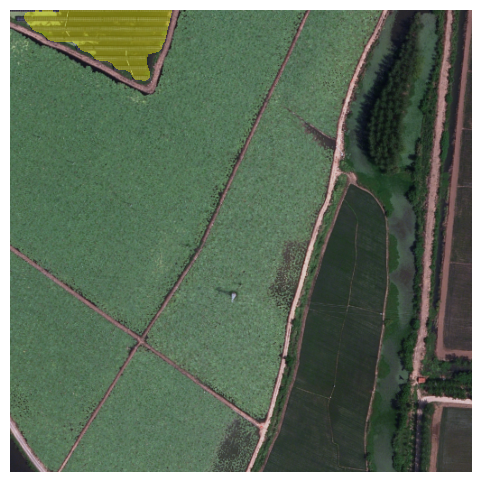

Epoch 23/30
1/1 [==============================] - 0s 31ms/step


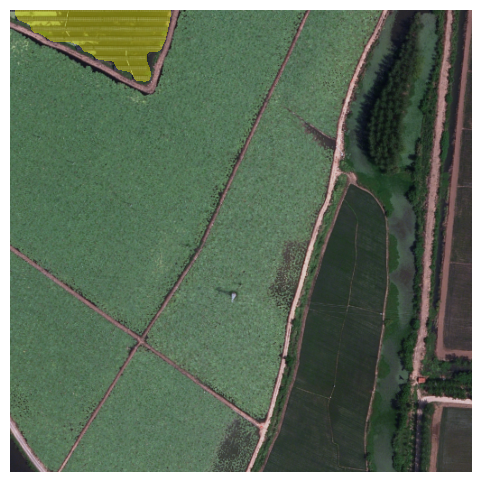

Epoch 24/30
1/1 [==============================] - 0s 30ms/step


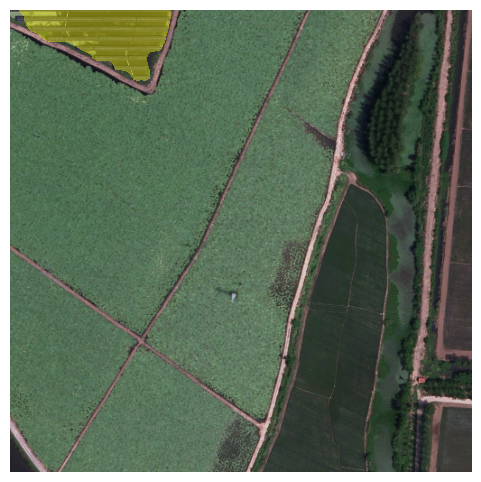

Epoch 25/30
1/1 [==============================] - 0s 30ms/step


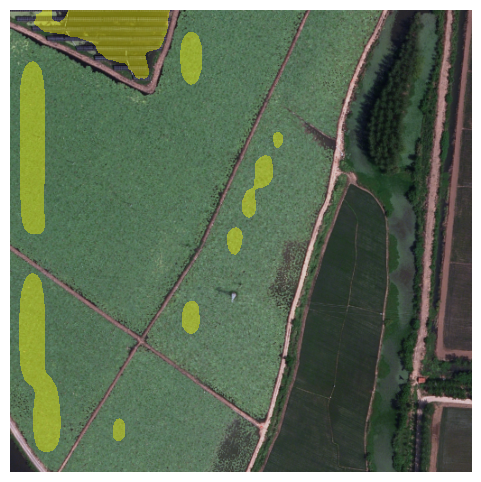

Epoch 26/30
1/1 [==============================] - 0s 33ms/step


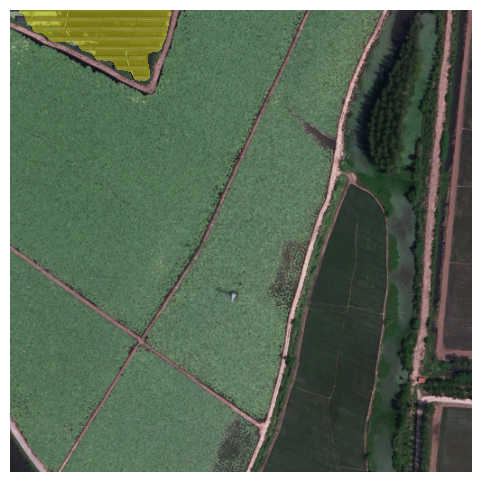

Epoch 27/30
1/1 [==============================] - 0s 30ms/step


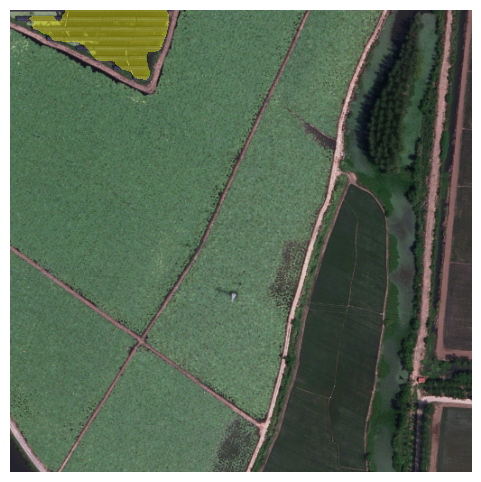

Epoch 28/30
1/1 [==============================] - 0s 30ms/step


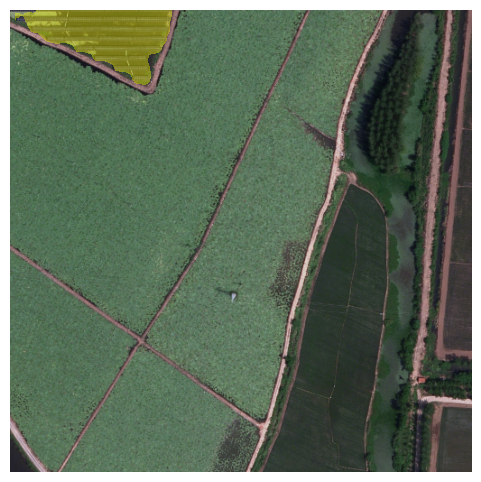

Epoch 29/30
1/1 [==============================] - 0s 33ms/step


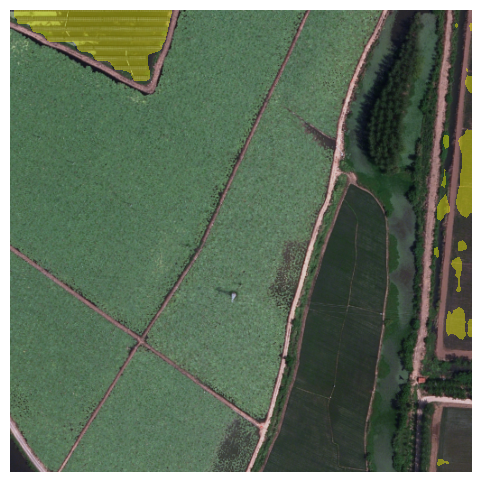

Epoch 30/30
402/402 [==============================] - 162s 403ms/step - loss: 0.0599 - accuracy: 0.9787 - val_loss: 0.0854 - val_accuracy: 0.9704


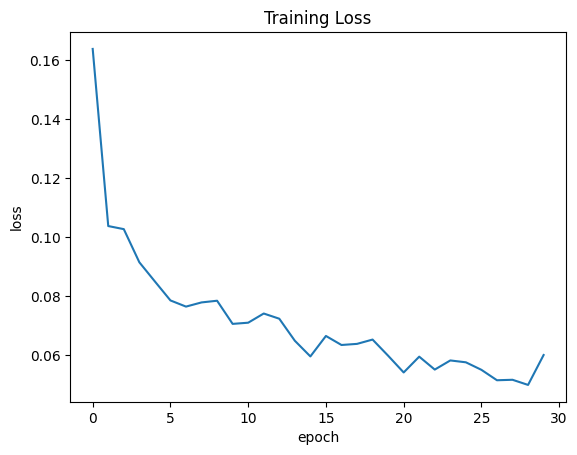

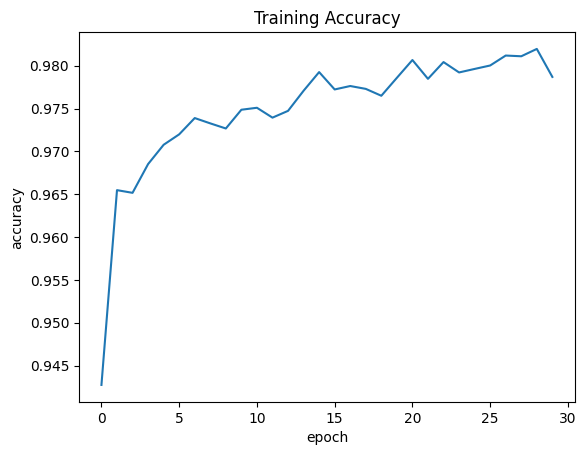

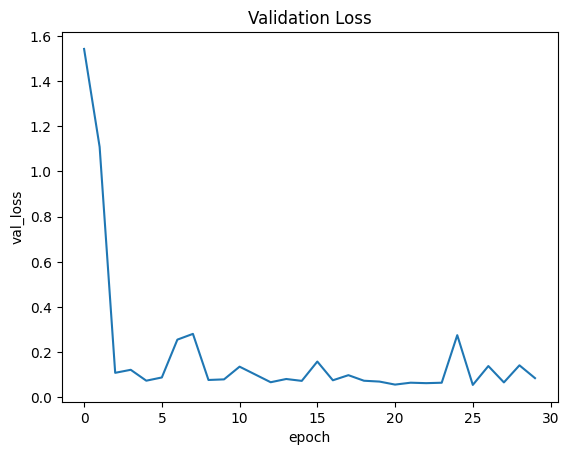

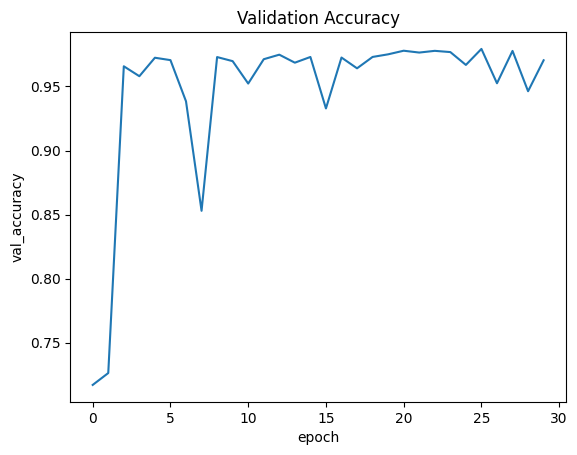

In [ ]:
EPOCHS = 30
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE

class DisplayCallback(tf.keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs=None):
          show_prediction(sample_image)

loss = keras.losses.SparseCategoricalCrossentropy(from_logits=True)
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss=loss,
    metrics=["accuracy"],
)


history = model.fit(train_dataset, steps_per_epoch=STEPS_PER_EPOCH,
validation_data=valid_dataset, epochs=EPOCHS, callbacks=[DisplayCallback()])

plt.plot(history.history["loss"])
plt.title("Training Loss")
plt.ylabel("loss")
plt.xlabel("epoch")
plt.show()

plt.plot(history.history["accuracy"])
plt.title("Training Accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.show()

plt.plot(history.history["val_loss"])
plt.title("Validation Loss")
plt.ylabel("val_loss")
plt.xlabel("epoch")
plt.show()

plt.plot(history.history["val_accuracy"])
plt.title("Validation Accuracy")
plt.ylabel("val_accuracy")
plt.xlabel("epoch")
plt.show()



In [ ]:
model.save('deeplabv3-pv03-aug.keras')

In [ ]:
model.save("deeplabv3-no-aug-30ep.pt")

In [ ]:
df = pd.read_csv("data2.csv")

model1 = keras.load("deeplabv3_aug")
model2 = keras.load("deeplabv3_non_aug")
model3 = keras.load("yolo_aug")
model4 = keras.load("yolo_non_aug")

a1 = model.predict()
a2 = model2.predict()
a3 = model3.predict()
a4 = model4.predict

print('validation accuracy for Deeplab V3 - aug is' + a1)
print('validation accuracy for Deeplab V3 - non_aug is '+ a2)
print('validation accuracy for YOLO- aug is '+ a3)
print('validation accuracy for YOLO - non_aug  is'+ a4)


validation accuracy for Deeplab V3 - aug is 0.91
validation accuracy for Deeplab V3 - non_aug is 0.85
validation accuracy for YOLO- aug is 0.59
validation accuracy for YOLO - non_aug  is 0.54
